<center> <h1> Imports </h1> </center>

In [1]:
import warnings;
warnings.simplefilter('ignore');
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder


In [3]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

<h3> Read CSV and show datatypes <h3>

In [4]:
data = pd.read_csv('apples.csv',on_bad_lines='skip', delimiter=";")
data.dtypes

Unnamed: 0         int64
date              object
average_price    float64
total_volume       int64
gala               int64
fuji               int64
granny_smith       int64
total_bags         int64
s_bags             int64
l_bags             int64
xl_bags            int64
type              object
region            object
dtype: object

In [5]:
plt.rcParams['figure.figsize'] = [20,15]

<h3> changing the date into the datetime format <h3>

In [6]:
data['date'] = pd.to_datetime(data['date'])
#data = data.rename(columns={'Unnamed: 0': 'Week'})
data = data.drop(['Unnamed: 0'], axis = 1)
data.dtypes

date             datetime64[ns]
average_price           float64
total_volume              int64
gala                      int64
fuji                      int64
granny_smith              int64
total_bags                int64
s_bags                    int64
l_bags                    int64
xl_bags                   int64
type                     object
region                   object
dtype: object

 <center> <h1> Cleaning Data </h1> <center>

<h3> Defining dates <h3>

In [7]:
data["year"] = data["date"].dt.year
data["month"] = data["date"].dt.month
data["week"] = data["date"].dt.isocalendar().week
data["day"] = data["date"].dt.day

<h3> Excluding regions that are overlapping eachother <h3>

In [8]:
CountriesToExclude = ["TotalUS","West","Southeast","SouthCentral","Northeast","Midsouth","GreatLakes","California"]
countriesExcludedList = data[~data['region'].isin(CountriesToExclude)]
countriesExcludedList.dtypes
countriesExcludedList.last
regiondata = countriesExcludedList.groupby(countriesExcludedList['region'])['region']
#countriesExcludedList['region'].unique()

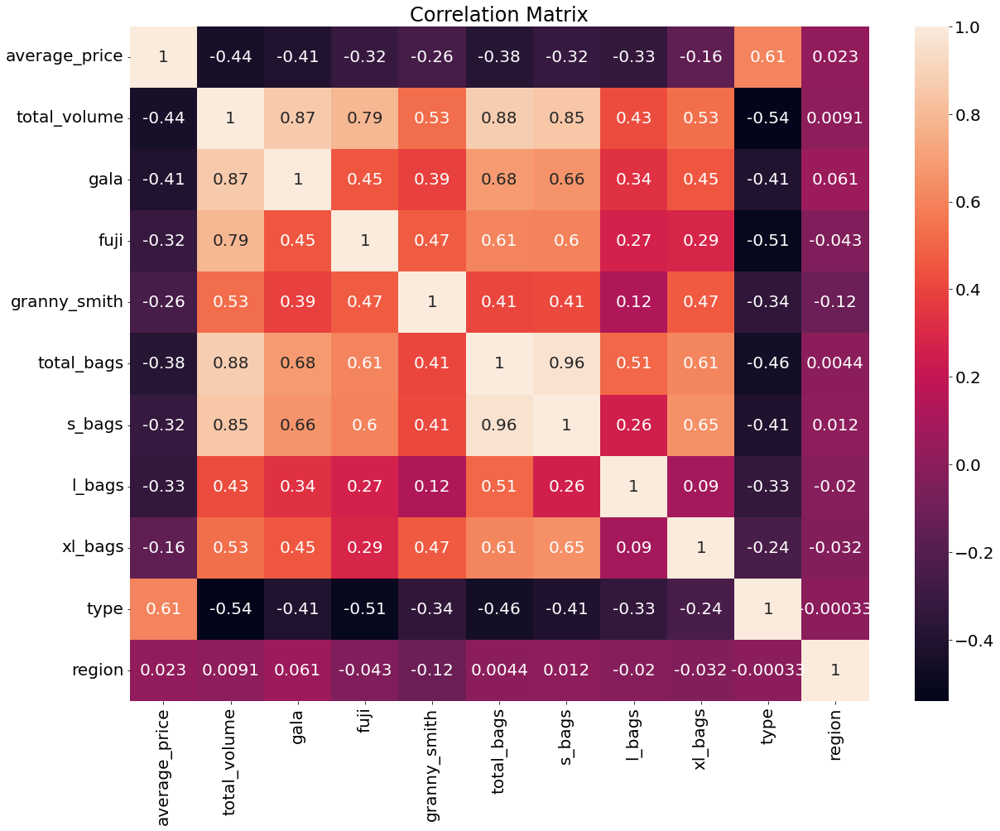

In [9]:
plt.rcParams['font.size'] = 20.00
data_to_correlate = countriesExcludedList[countriesExcludedList.columns[~countriesExcludedList.columns.isin(["year", "month", "week", "day"])]]
type_encoder = LabelEncoder()
data_to_correlate["type"] = type_encoder.fit_transform(data_to_correlate["type"])
region_encoder = LabelEncoder()
data_to_correlate["region"] = region_encoder.fit_transform(data_to_correlate["region"])

sns.heatmap(data_to_correlate.corr(), annot=True).set(title="Correlation Matrix")

plt.show()

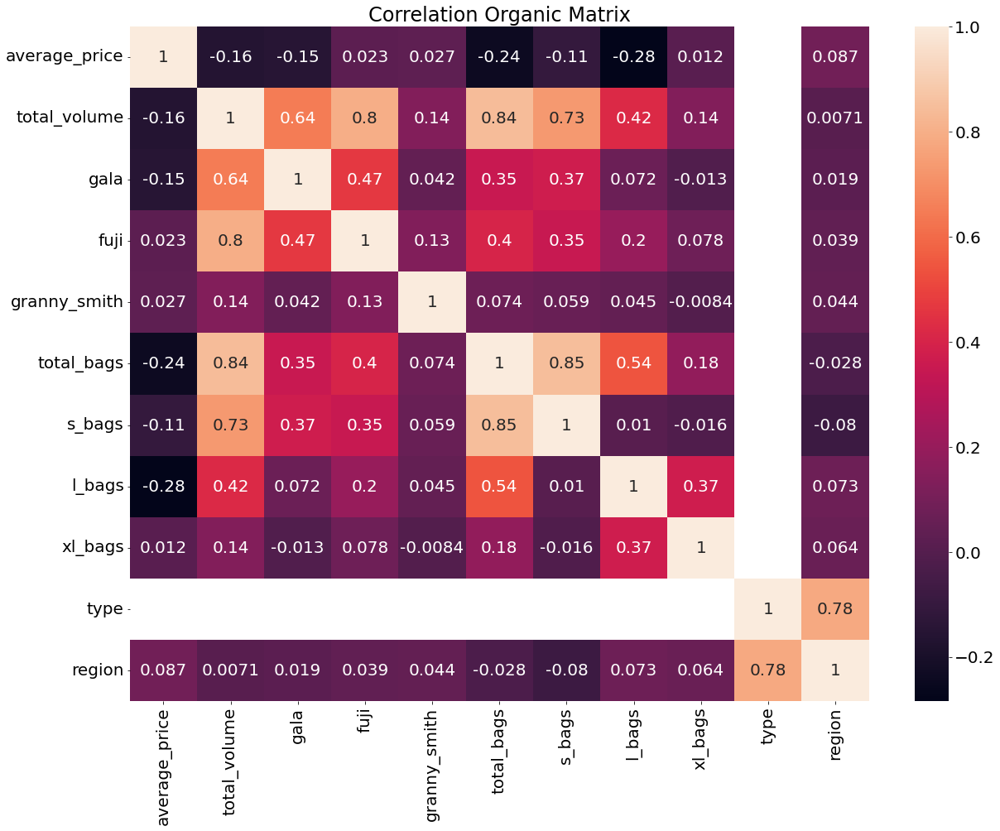

In [10]:
organicheatmap = countriesExcludedList.where(countriesExcludedList['type']=='organic')


data_to_correlate = organicheatmap[organicheatmap.columns[~organicheatmap.columns.isin(["year", "month", "week", "day"])]]


type_encoder = LabelEncoder()
data_to_correlate["type"] = type_encoder.fit_transform(data_to_correlate["type"])
region_encoder = LabelEncoder()
data_to_correlate["region"] = region_encoder.fit_transform(data_to_correlate["region"])

sns.heatmap(data_to_correlate.corr(), annot=True).set(title="Correlation Organic Matrix")

plt.show()

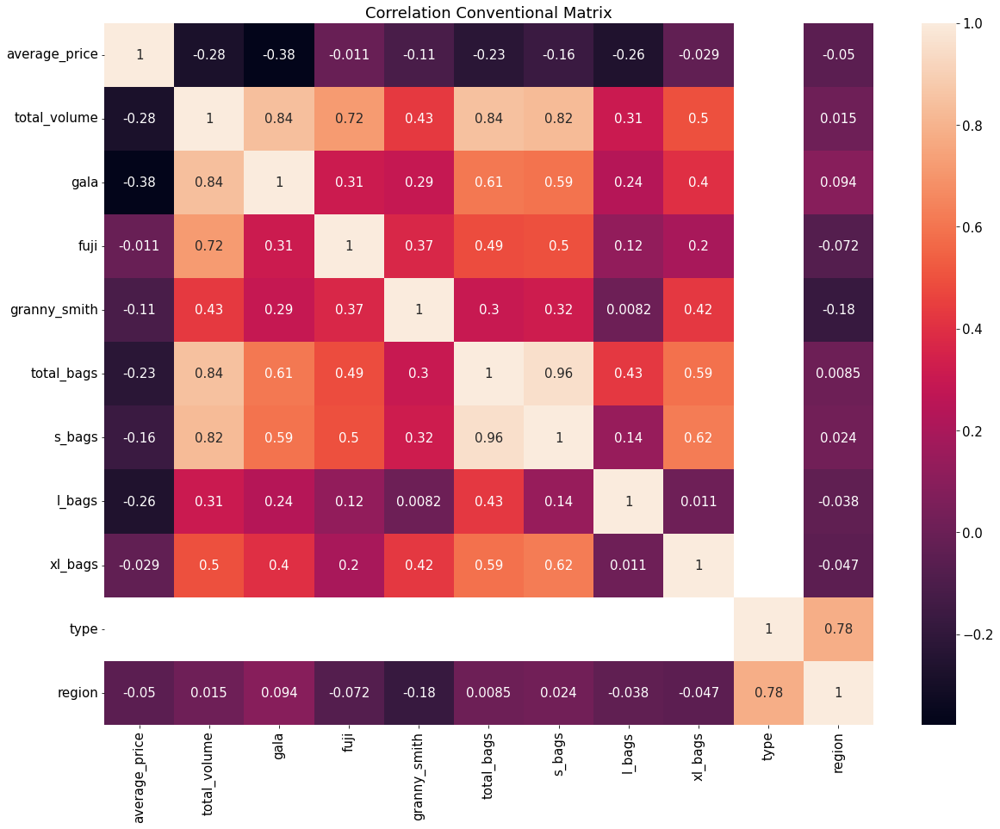

In [11]:
plt.rcParams['font.size'] = 15.00
conventionalheatmap = countriesExcludedList.where(countriesExcludedList['type']=='conventional')


data_to_correlate = conventionalheatmap[conventionalheatmap.columns[~conventionalheatmap.columns.isin(["year", "month", "week", "day"])]]


type_encoder = LabelEncoder()
data_to_correlate["type"] = type_encoder.fit_transform(data_to_correlate["type"])
region_encoder = LabelEncoder()
data_to_correlate["region"] = region_encoder.fit_transform(data_to_correlate["region"])

sns.heatmap(data_to_correlate.corr(), annot=True).set(title="Correlation Conventional Matrix")

plt.show()

 <center> <h1> Generating Profile </h1> <center>

In [12]:
plt.rcParams['font.size'] = 15.00
profile = ProfileReport(data, title="Apples Data")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:

# Sorting by column 'Date'
#data.sort_values(by=['date'])

<h3> Defining a Weighted Average function <h3>

In [14]:

def weighted_average(df, values, weights):
    return sum(df[weights] * df[values]) / df[weights].sum()

<center> <h2> Total Volume Of Apples </h2> <center>

<h3> Comparison between the total amounts of each type of apple <h3>

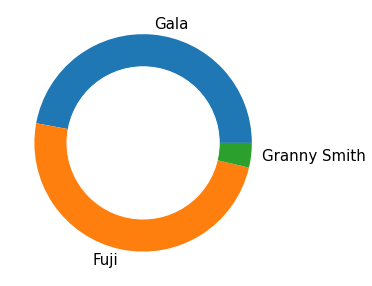

In [15]:
gala = countriesExcludedList['gala'].sum()
fuji = countriesExcludedList['fuji'].sum()
granny_smith = countriesExcludedList['granny_smith'].sum()


plt.rcParams['figure.figsize'] = [10,5]
# create data
size_of_groups=[gala,fuji,granny_smith]

# Create a pieplot
plt.pie(size_of_groups,labels=['Gala','Fuji','Granny Smith'])

# add a circle at the center to transform it in a donut chart
my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)

plt.show()

In [16]:
organicgala = countriesExcludedList.groupby(countriesExcludedList['type']=='organic')['gala'].sum()
organicfuji = countriesExcludedList.groupby(countriesExcludedList['type']=='organic')['fuji'].sum()
organicgranny = countriesExcludedList.groupby(countriesExcludedList['type']=='organic')['granny_smith'].sum()

convenctionalgala = countriesExcludedList.groupby(countriesExcludedList['type']=='conventional')['gala'].sum()
convenctionalfuji = countriesExcludedList.groupby(countriesExcludedList['type']=='conventional')['fuji'].sum()
convenctionalgranny = countriesExcludedList.groupby(countriesExcludedList['type']=='conventional')['granny_smith'].sum()

 <h3> Comparison between conventional and organic in each apple type </h3>

array([<AxesSubplot:ylabel='Gala'>, <AxesSubplot:ylabel='Fuji'>,
       <AxesSubplot:ylabel='Granny Smith'>], dtype=object)

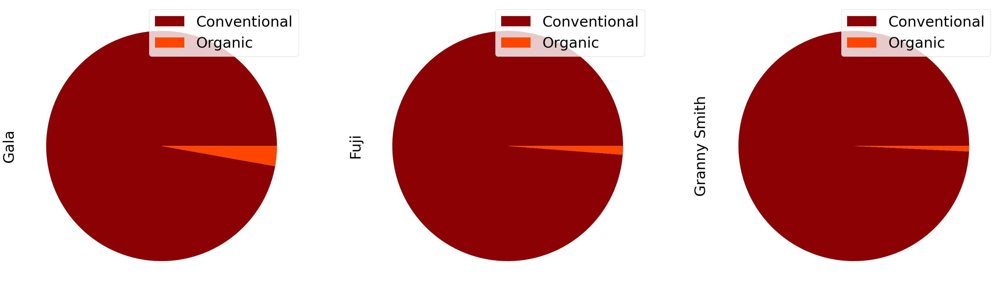

In [17]:
plt.rcParams['figure.figsize'] = [20,15]
plt.rcParams['font.size'] = 50.00
datatoplot = pd.DataFrame(
    {'Conventional':[convenctionalgala[True],convenctionalfuji[True],convenctionalgranny[True]],
    'Organic':[organicfuji[True],organicgala[True],organicgranny[True]]}
    , index=['Gala','Fuji','Granny Smith'])
datatoplot.T.plot.pie(subplots=True, figsize=(60, 30),legend=['Conventional','Organic'],labeldistance=None,colors = ['darkred','orangered'])

In [18]:
weighteraveragegraph = data.groupby([ data['date'].dt.strftime('%W')]).apply(weighted_average ,'average_price', 'total_volume')

averagedconventional =  data.where((data['type']=="conventional"))
averagedconventional = averagedconventional.dropna()
averagedconventional = averagedconventional.groupby([ averagedconventional['date'].dt.strftime('%W')]).apply(weighted_average ,'average_price', 'total_volume')

averagedorganic =  data.where((data['type']=="organic"))
averagedorganic = averagedorganic.dropna()
averagedorganic = averagedorganic.groupby([ averagedorganic['date'].dt.strftime('%W')]).apply(weighted_average ,'average_price', 'total_volume')

<center> <h2> Average price per week over the 4 years </h2> <center>

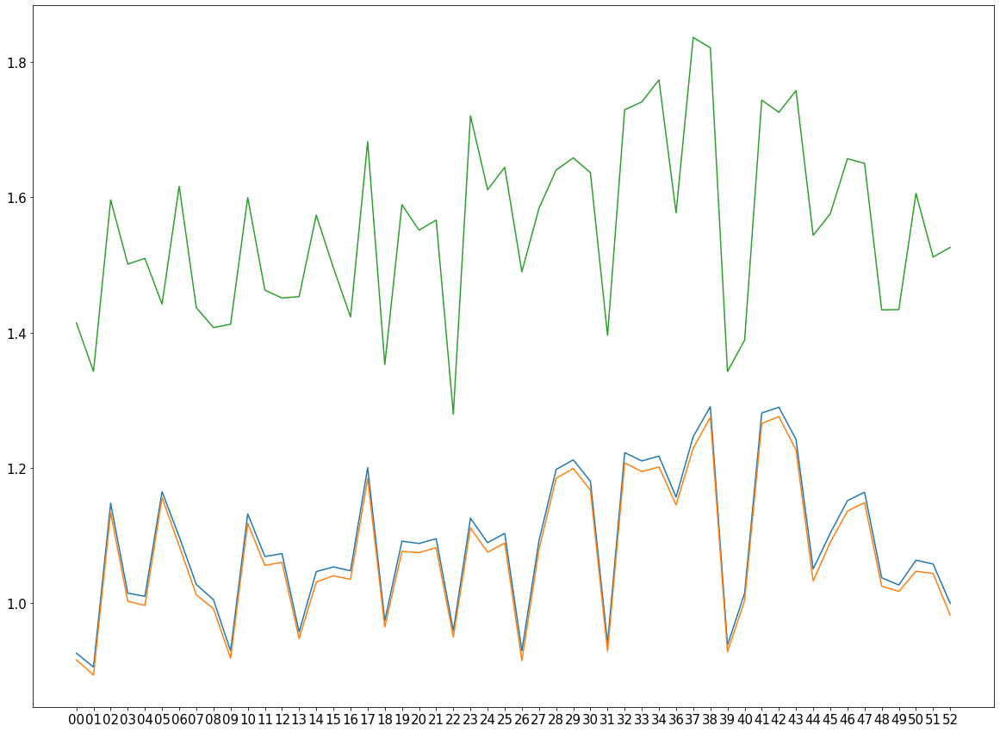

In [19]:
plt.rcParams['font.size'] = 15.00
plt.plot(weighteraveragegraph)
plt.plot(averagedconventional)
plt.plot(averagedorganic)

In [20]:
regiondata = data.groupby(data['region'])

In [21]:
data_to_split = data.drop(columns=["date", "month", "day"])

fifteen_year = data_to_split.loc[data["year"] == 2015]
fifteen_year = fifteen_year.drop(columns=["year"])

sixteen_year = data_to_split.loc[data["year"] == 2016]
sixteen_year = sixteen_year.drop(columns=["year"])

seventeen_year = data_to_split.loc[data["year"] == 2017]
seventeen_year = seventeen_year.drop(columns=["year"])

eighteen_year = data_to_split.loc[data["year"] == 2018]
eighteen_year = eighteen_year.drop(columns=["year"])

<center> <h2> Average price per week over the 4 years <h2> <center>

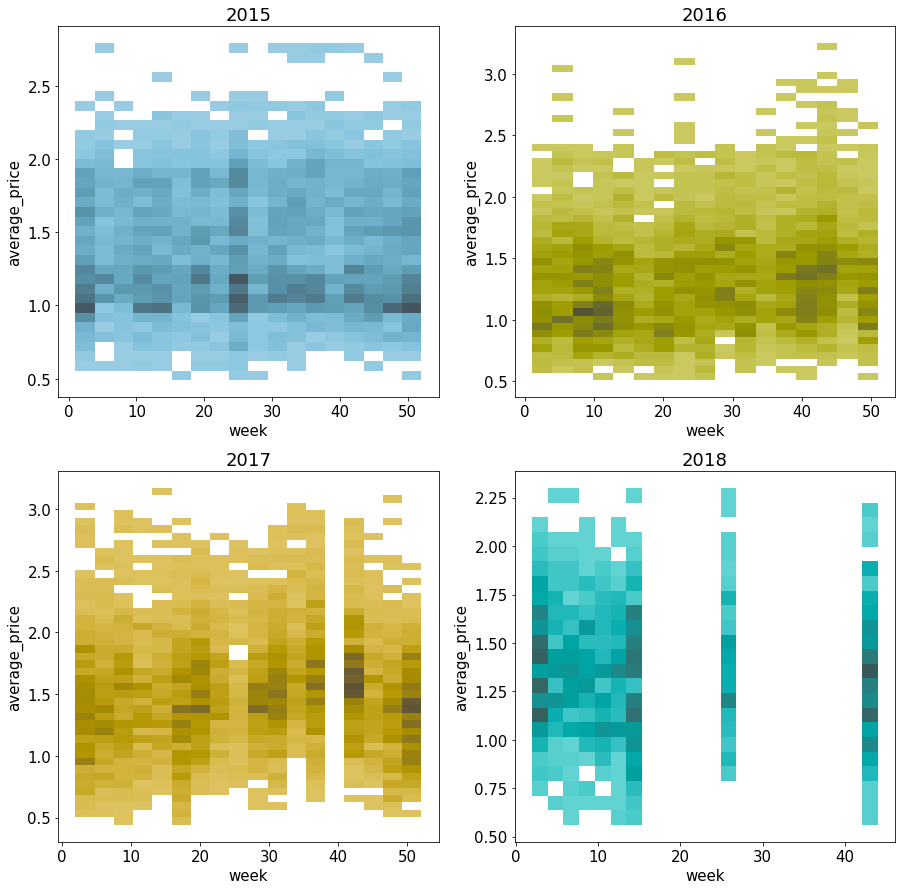

In [22]:
plt.rcParams['font.size'] = 15.00
fig, axs = plt.subplots(2, 2, figsize=(15, 15))

sns.histplot(data=fifteen_year, x="week", y="average_price", kde=True, color="skyblue", ax=axs[0, 0]).set_title("2015")
sns.histplot(data=sixteen_year, x="week", y="average_price",kde=True, color="olive", ax=axs[0, 1]).set_title("2016")
sns.histplot(data=seventeen_year, x="week", y="average_price",kde=True, color="gold", ax=axs[1, 0]).set_title("2017")
sns.histplot(data=eighteen_year, x="week", y="average_price", kde=True, color="teal", ax=axs[1, 1]).set_title("2018")
plt.show()

<center> <h2> Average total volume per week over the 4 years </h2> <center>

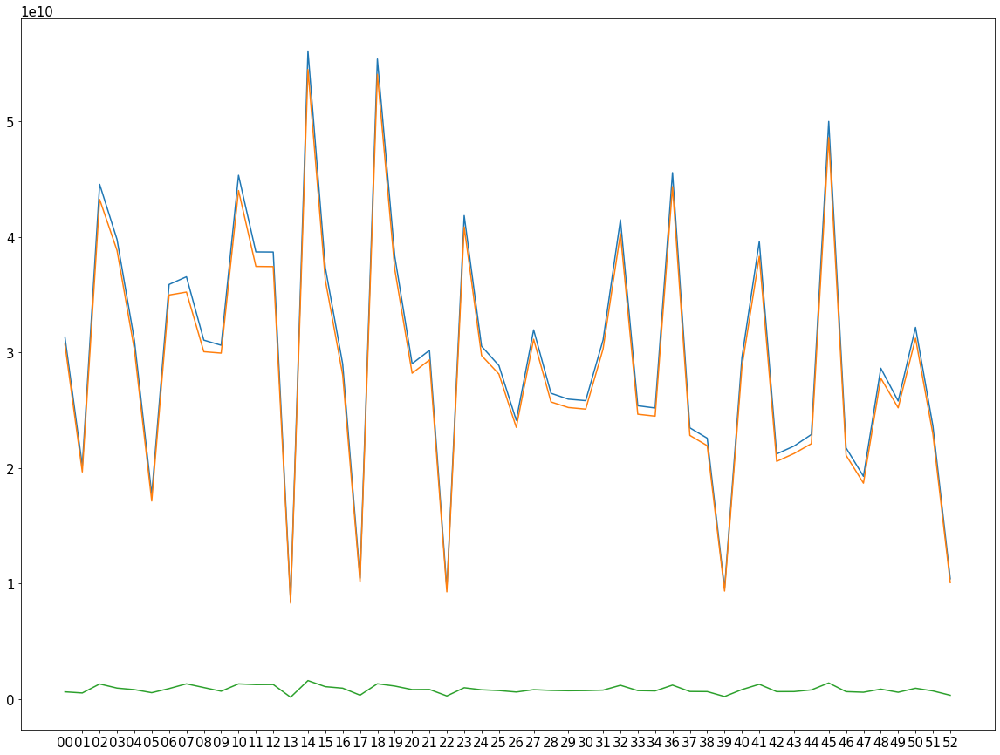

In [23]:

prodall = data.groupby([ data['date'].dt.strftime('%W')])['total_volume'].sum()

prodconv =  data.where((data['type']=="conventional"))
prodconv = prodconv.dropna()
prodconv = prodconv.groupby([ prodconv['date'].dt.strftime('%W')])['total_volume'].sum()

prodorg =  data.where((data['type']=="organic"))
prodorg = prodorg.dropna()
prodorg = prodorg.groupby([ prodorg['date'].dt.strftime('%W')])['total_volume'].sum()


plt.plot(prodall)
plt.plot(prodconv)
plt.plot(prodorg)


In [24]:
productionall = countriesExcludedList.groupby([ countriesExcludedList['date'].dt.strftime('%W')])['total_volume'].sum()

productiongala = countriesExcludedList.groupby([ countriesExcludedList['date'].dt.strftime('%W')])['gala'].sum()

productionfuji = countriesExcludedList.groupby([ countriesExcludedList['date'].dt.strftime('%W')])['fuji'].sum()

productiongranny = countriesExcludedList.groupby([ countriesExcludedList['date'].dt.strftime('%W')])['granny_smith'].sum()


<center> <h2> Average total volume for each apple type per week over the 4 years </h2> <center>

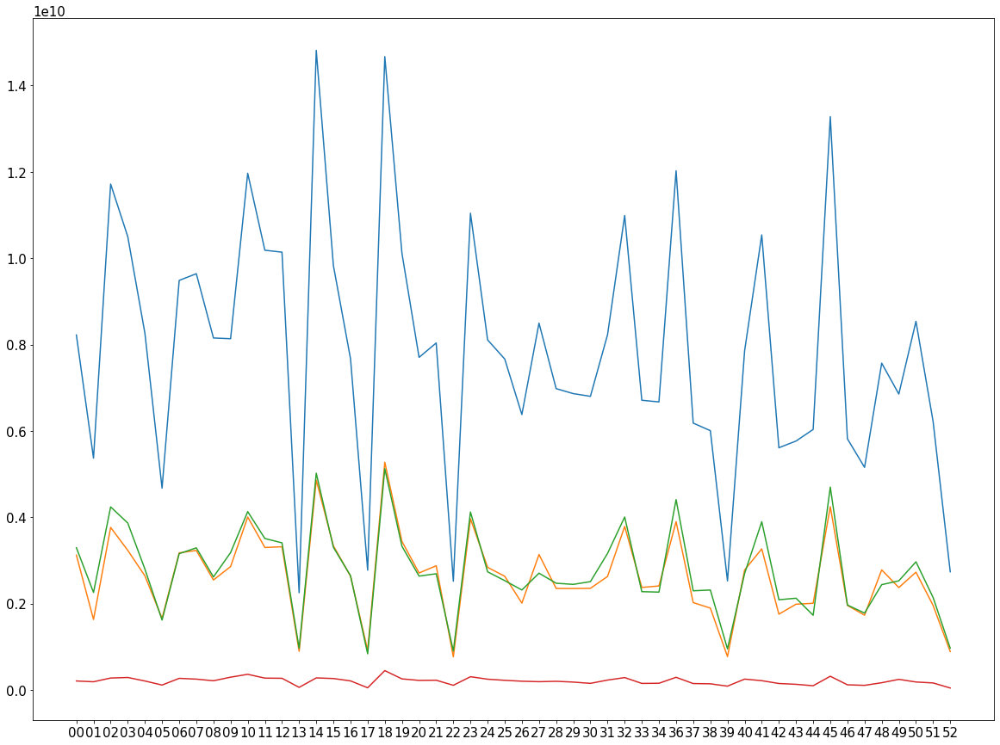

In [25]:
plt.plot(productionall)
plt.plot(productiongala)
plt.plot(productionfuji)
plt.plot(productiongranny)

<center> <h2> Average price per day of the week </h2> <center>

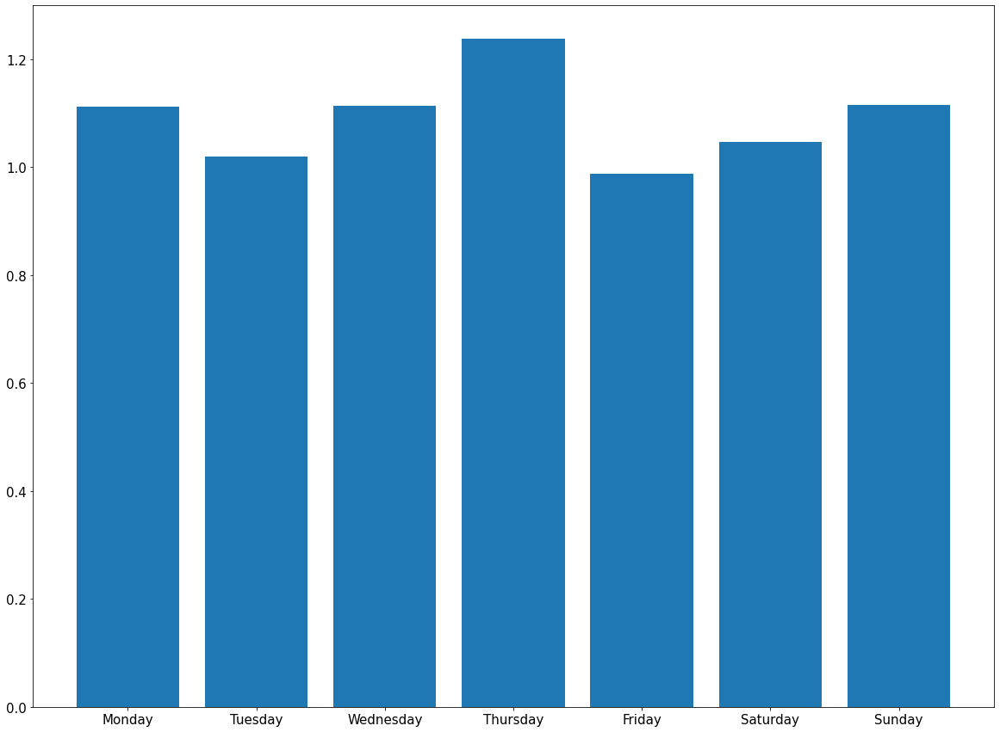

In [26]:
# Make a random dataset:
weekday_price = countriesExcludedList .groupby((countriesExcludedList.date.dt.dayofweek)).apply(weighted_average ,'average_price', 'total_volume')

bars = ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday','Saturday','Sunday')
y_pos = np.arange(len(bars))

# Create bars
plt.bar(y_pos, weekday_price)

# Create names on the x-axis
plt.xticks(y_pos, bars)

# Show graphic
plt.show()




<center> <h2> Average price per month </h2> <center>

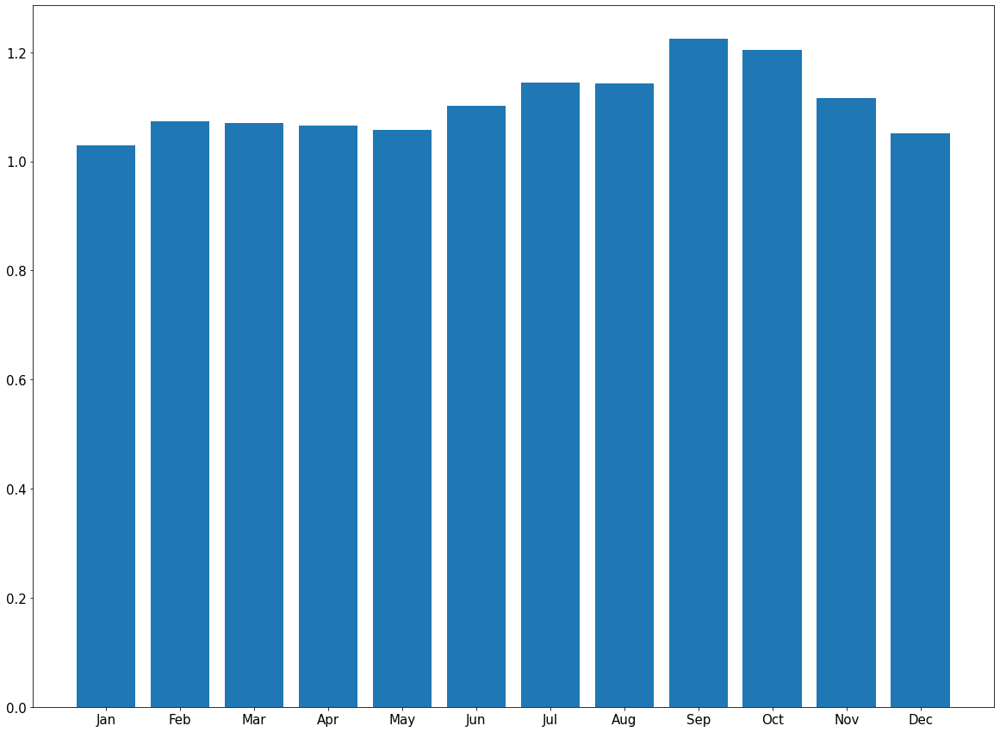

In [27]:

monthly_price_all = countriesExcludedList.copy()
monthly_price_all = monthly_price_all.dropna()
monthly_price_all = monthly_price_all .groupby(monthly_price_all['month']).apply(weighted_average ,'average_price', 'total_volume')

bars = ('Jan', 'Feb', 'Mar', 'Apr', 'May','Jun','Jul','Aug','Sep','Oct','Nov','Dec')
y_pos = np.arange(len(bars))

# Create bars
plt.bar(y_pos,monthly_price_all)

# Create names on the x-axis
plt.xticks(y_pos, bars)

plt.show()



<center> <h2> Average price per week separated by year (2018 removed) </h2> <center>

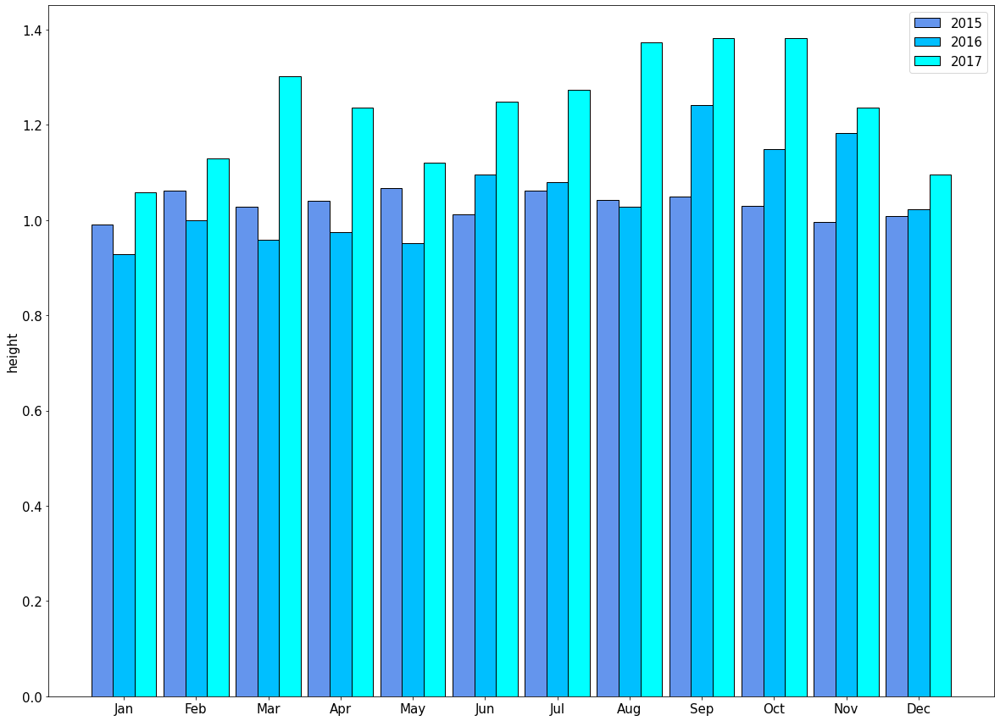

In [28]:


monthly_price_2016 = countriesExcludedList.where((countriesExcludedList['year'])==2016)
monthly_price_2016 = monthly_price_2016.dropna()
monthly_price_2016 = monthly_price_2016 .groupby(monthly_price_2016['month']).apply(weighted_average ,'average_price', 'total_volume')

monthly_price_2017 = countriesExcludedList.where((countriesExcludedList['year'])==2017)
monthly_price_2017 = monthly_price_2017.dropna()
monthly_price_2017 = monthly_price_2017 .groupby(monthly_price_2017['month']).apply(weighted_average ,'average_price', 'total_volume')


monthly_price_2018 = countriesExcludedList.where((countriesExcludedList['year'])==2018)
monthly_price_2018 = monthly_price_2018.dropna()
monthly_price_2018 = monthly_price_2018 .groupby(monthly_price_2018['month']).apply(weighted_average ,'average_price', 'total_volume')


monthly_price_2015 = countriesExcludedList.where((countriesExcludedList['year'])==2015)
monthly_price_2015 = monthly_price_2015.dropna()
monthly_price_2015 = monthly_price_2015 .groupby(monthly_price_2015['month']).apply(weighted_average ,'average_price', 'total_volume')







bars = ('Jan', 'Feb', 'Mar', 'Apr', 'May','Jun','Jul','Aug','Sep','Oct','Nov','Dec')
y_pos = np.arange(len(bars))

barWidth = 0.3
 
# Choose the height of the blue bars
bars1 = monthly_price_2015
 
#Choose the height of the cyan bars
bars2 = monthly_price_2016
 
bars3 = monthly_price_2017


r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x2 + barWidth for x2 in r2]


# Create blue bars
plt.bar(r1, bars1, width = barWidth, color = 'cornflowerblue', edgecolor = 'black',capsize=7, label='2015')
 
# Create cyan bars
plt.bar(r2, bars2, width = barWidth, color = 'deepskyblue', edgecolor = 'black', capsize=7, label='2016')

# Create cyan bars
plt.bar(r3, bars3, width = barWidth, color = 'cyan', edgecolor = 'black', capsize=7, label='2017')


# general layout
plt.xticks([r + barWidth for r in range(len(bars1))], ['Jan', 'Feb', 'Mar', 'Apr', 'May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.ylabel('height')
plt.legend()
 
# Show graphic
plt.show()


<center> <h2> Average total volume by month over the 4 years </h2> <center>

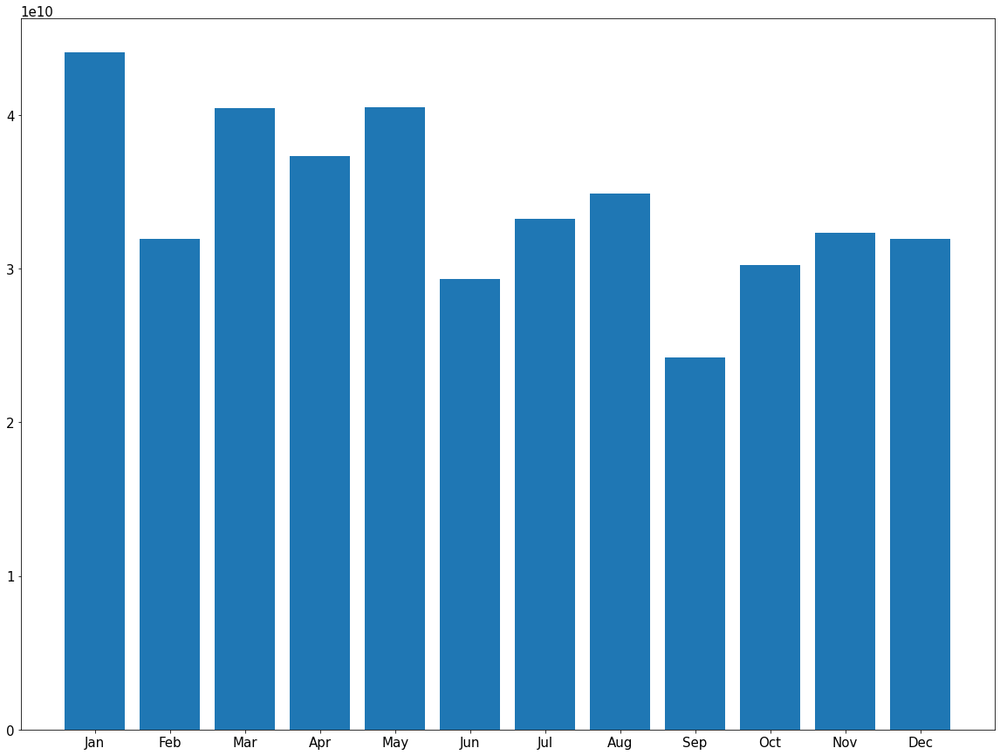

In [29]:


monthly_production_all = countriesExcludedList.copy()
monthly_production_all = monthly_production_all.dropna()
monthly_production_all = monthly_production_all.groupby(monthly_production_all['month'])['total_volume'].sum()


bars = ('Jan', 'Feb', 'Mar', 'Apr', 'May','Jun','Jul','Aug','Sep','Oct','Nov','Dec')
y_pos = np.arange(len(bars))

# Create bars
plt.bar(y_pos,monthly_production_all)

# Create names on the x-axis
plt.xticks(y_pos, bars)

plt.show()



<center> <h2> Average total volume per month separated by year (2018 removed) </h2> <center>

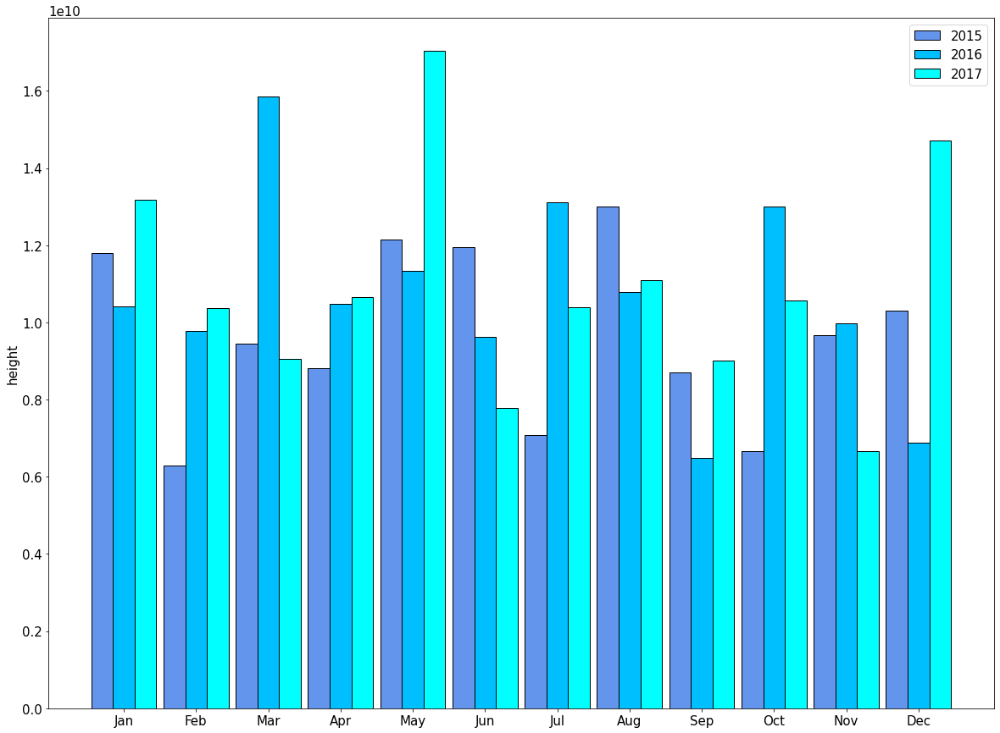

In [30]:



monthly_production_2015 = countriesExcludedList.where((countriesExcludedList['year'])==2015)
monthly_production_2015 = monthly_production_2015.dropna()
monthly_production_2015 = monthly_production_2015.groupby(monthly_production_2015['month'])['total_volume'].sum()

monthly_production_2016 = countriesExcludedList.where((countriesExcludedList['year'])==2016)
monthly_production_2016 = monthly_production_2016.dropna()
monthly_production_2016 = monthly_production_2016.groupby(monthly_production_2016['month'])['total_volume'].sum()

monthly_production_2017 = countriesExcludedList.where((countriesExcludedList['year'])==2017)
monthly_production_2017 = monthly_production_2017.dropna()
monthly_production_2017 = monthly_production_2017.groupby(monthly_production_2017['month'])['total_volume'].sum()

monthly_production_2018 = countriesExcludedList.where((countriesExcludedList['year'])==2018)
monthly_production_2018 = monthly_production_2018.dropna()
monthly_production_2018 = monthly_production_2018.groupby(monthly_production_2018['month'])['total_volume'].sum()








bars = ('Jan', 'Feb', 'Mar', 'Apr', 'May','Jun','Jul','Aug','Sep','Oct','Nov','Dec')
y_pos = np.arange(len(bars))

barWidth = 0.3
 
# Choose the height of the blue bars
bars1 = monthly_production_2015
 
#Choose the height of the cyan bars
bars2 = monthly_production_2016
 
bars3 = monthly_production_2017


r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x2 + barWidth for x2 in r2]


# Create blue bars
plt.bar(r1, bars1, width = barWidth, color = 'cornflowerblue', edgecolor = 'black',capsize=7, label='2015')
 
# Create cyan bars
plt.bar(r2, bars2, width = barWidth, color = 'deepskyblue', edgecolor = 'black', capsize=7, label='2016')

# Create cyan bars
plt.bar(r3, bars3, width = barWidth, color = 'cyan', edgecolor = 'black', capsize=7, label='2017')


# general layout
plt.xticks([r + barWidth for r in range(len(bars1))], ['Jan', 'Feb', 'Mar', 'Apr', 'May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.ylabel('height')
plt.legend()
 
# Show graphic
plt.show()

